# **大人数の足音の分離**

## 概要

4人の人間の足音を分離する。自宅において我が家族(4人)の足音を6箇所で録音し、分離を行う。

In [1]:
from IPython.display import Audio
Audio('data/footsteps1.wav')

In [2]:
Audio('data/footsteps2.wav')

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import random

def ICA(datanum, X, datadim):
    
    X = np.array(X) 
    datasize, datanum = X.shape     # datasizeは時系列の数、datanumはデータ数
    
    # Xの各列ベクトルの平均を0にする
    X = X - np.mean(X, axis=0)
    X = X.T
    
    # 共分散行列を求める
    # 共分散行列VarSigmaは、以下の式で求める
    # VarSigma = E[x_j * x_j^T]
    VarSigma = np.zeros((datanum, datanum))
    for j in range(datasize):
        VarSigma += np.outer(X[:,j], X[:,j])    # np.outerは直積(ベクトルどうしのテンソル積)
    VarSigma /= datasize
    
    # 対称行列の直交行列による対角化
    def Eigenvalue_decomp(A):
        # A: 対称行列
        # return: 対角化された対称行列D, 直交行列E
        # A = EDE^T
        # D: 対角行列
        # E: 直交行列
        la, U = np.linalg.eig(A)
        D = np.diag(la)
        E, _ = np.linalg.qr(U)
        return D, E
    
    # 共分散行列を直交行列Eにより対角化する
    # D: 対角行列
    # E: 直交行列
    D, E = Eigenvalue_decomp(VarSigma)
    
    # V = E * D^(-1/2) * E^T    を求める
    D_sub = np.linalg.inv(np.power(D, 0.5))
    V = np.matmul(np.matmul(E, D_sub), E.T)

    # 列ベクトルがz_jになる行列Zを求める(このZを介してXを独立な信号源に変換する)
    Z = np.matmul(V, X)
    
    flag2 = 0
    while flag2 == 0:
        # 信号源は、観測データの線形結合で表されると仮定し、Zから独立な信号源への変換行列Wを求める
        # 適当な行列Wを用意し、初期化する
        # 行列のサイズは、datadim×datanumとする
        W = []
        for j in range(datadim):
            W.append([random.random() for i in range(datanum)])
        W = np.array(W)
        
        # Wを行ベクトル(datadim次元)ごとに正規化する
        for i in range(datadim):
            W[i] /= np.linalg.norm(W[i])
        print("W:",W)
            
        # Wの行ベクトルを更新する(第i行ベクトルを更新する)
        # Wの第i行ベクトルを転置したもの(N次元列ベクトル)をwt_iとし、以下の式で更新する
        # wt_i = E[z_j * (wt_i^T * z_j)^3] - 3 * wt_i
        # 更新したwt_iを正規化する
        # 変化している場合は、更新を続ける
        for i in range(datadim):
            wt_i = W[i]
            while True:
                wt_i_old = wt_i
                wt_i = np.zeros(datanum)
                for j in range(datasize):
                    wt_i += Z[:,j] * np.power(np.dot(wt_i_old, Z[:,j]), 3)
                wt_i /= datasize
                wt_i -= 3 * wt_i_old
                wt_i /= np.linalg.norm(wt_i)
                # 振動するのを防ぐために、wt_iの第1成分を正にする
                if wt_i[0] < 0:
                    wt_i *= -1
                # 更新幅が小さくなったら終了
                if np.linalg.norm(wt_i - wt_i_old) < 0.0001:   # 0.00001
                    break
            # 初期値次第では、同じ行ベクトルが複数生成される場合があるので、それを防ぐ
            if i > 0:
                flag = 0
                # すでに生成された行ベクトルと同じものが生成された場合は、再生成する
                for j in range(i):
                    if np.linalg.norm(wt_i - W[j]) < 0.5:
                        W[i] = [random.random() for i in range(datanum)]
                        # 正規化する
                        W[i] /= np.linalg.norm(W[i])
                        i -= 1
                        flag = 1
                        break
                if flag == 0:
                    W[i] = wt_i
            else:
                W[i] = wt_i
        print("W:", W)
        
        # ZをWで変換し、独立な信号源Yを求める
        Y = np.matmul(W,Z)
        
        # Yの二つの行ベクトルの相関係数を求め、大きい場合は独立な信号源として扱わない
        flag2 = 1
        cormatrix = np.corrcoef(Y)
        for i in range(datadim):
            for j in range(i+1, datadim):
                # print("Y[",i,"]とY[",j,"]の相関係数:",np.corrcoef(Y[i], Y[j]))
                if cormatrix[i][j]>0.6:
                    flag2 = 0
                    break
            if flag2 == 0:
                break
    
    
    # 図示する
    plt.plot(Y[0])
    plt.plot(Y[1])
    plt.show()
    
    return Y

In [5]:
# データの読み込み
f1 = sp.io.wavfile.read('data/footsteps1.wav')
f2 = sp.io.wavfile.read('data/footsteps2.wav')
print(len(f1[1]))
print(len(f2[1]))

872592
913164


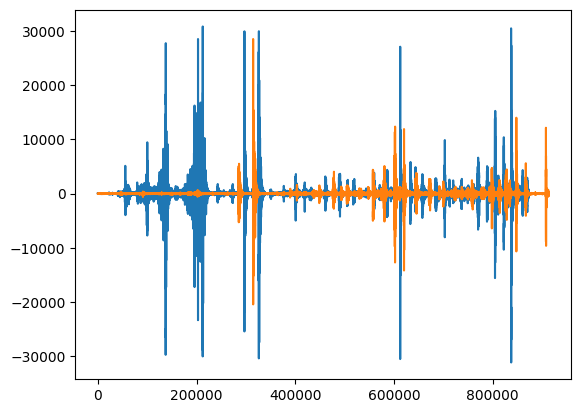

In [6]:
datanum = 2
# # 各時系列データのデータ数が等しいことを確認する
# datasizes = []
# datasizes.append(len(f1[1]))
# datasizes.append(len(f2[1]))
# print(datasizes)

# データを格納する
data = []
data.append(f1[1])
data.append(f2[1])
plt.plot(data[0])
plt.plot(data[1])
plt.show()
#data = np.array(data).T.tolist()

In [12]:
for i in range(len(f1[1])):
    if i > 250000 and f1[1][i] > 20000:
        print(i)

297025
297031
326047
326048
326104
326105
326106
326107
326108
326191
326192
326193
326239
326240
326255
326256
326294
326295
326296
326297
326298
326299
326300
326422
326959
326960
612507
612508
612509
612510
612511
837053
837054
837055
837056
837057
837118
837119
837195
837196
837197
837198
837220
837221
837324
837346
837347
837348
837349
837350
837351
837352
837353
837369
837370
837371
837372
837373
837374
837375
837376


In [11]:
for i in range(len(f2[1])):
    if f2[1][i] > 20000:
        print(i)

314624
314625
314626
314627
314628


In [13]:
data = []
data.append(f1[1][326047:326047+500000])
data.append(f2[1][314624:314624+500000])

In [19]:
f1

(48000, array([   0,    0,    0, ..., -182, -134, -131], dtype=int16))

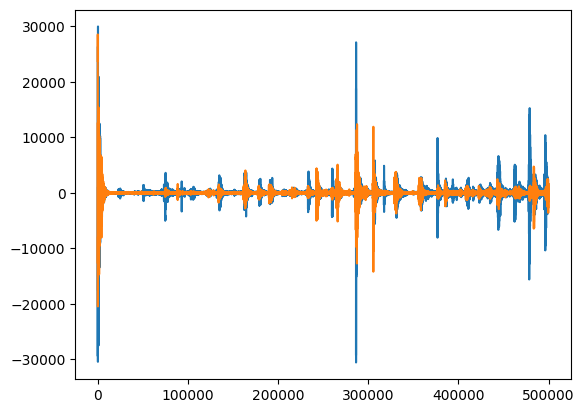

In [15]:
plt.plot(data[0])
plt.plot(data[1])
plt.show()
data = np.array(data).T.tolist()

W: [[0.2881953  0.95757165]
 [0.71475531 0.69937461]]
W: [[0.32103405 0.94706765]
 [0.04958739 0.99876979]]
W: [[0.24015039 0.9707357 ]
 [0.60978201 0.79256917]]
W: [[0.32103499 0.94706734]
 [0.98498959 0.17261378]]


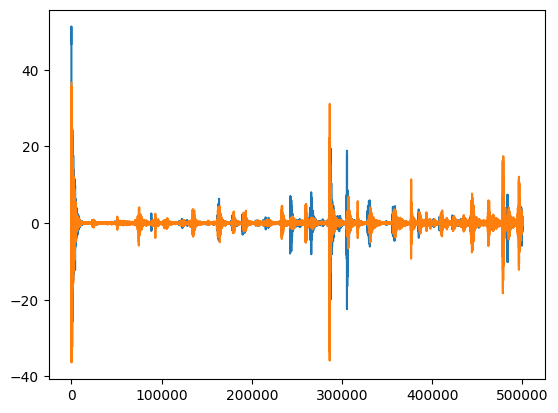

In [22]:
datadim = 2
Y = ICA(datanum, data, datadim)

W: [[0.91985248 0.39226446]
 [0.2764346  0.96103273]]
W: [[0.97541251 0.22038703]
 [0.32091965 0.94710642]]


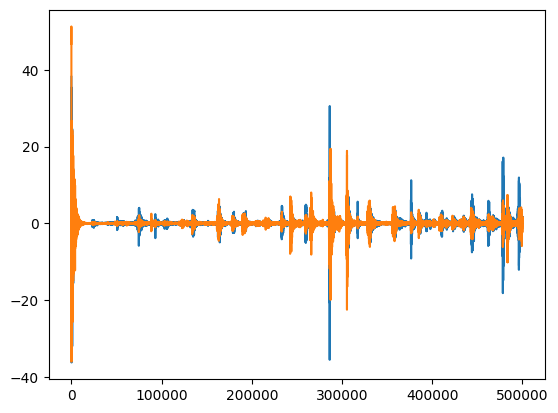

In [27]:
Y2 = ICA(datanum, data, datadim)

<class 'numpy.int16'>


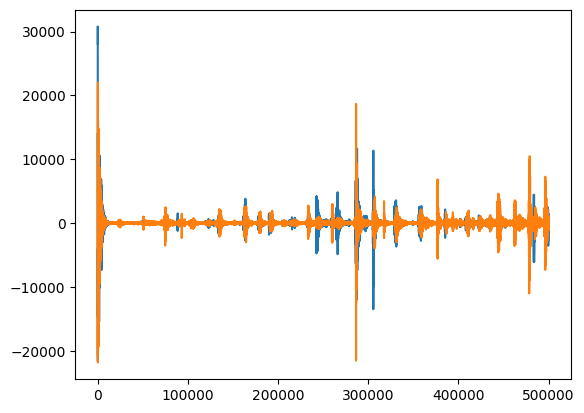

In [23]:
Y *= 600
Y = Y.astype(np.int16)
print(type(Y[0][0]))
plt.plot(Y[0])
plt.plot(Y[1])
plt.show()

sp.io.wavfile.write(filename='data/footstep1_ica.wav', rate=f1[0], data=Y[0])
sp.io.wavfile.write(filename='data/footstep2_ica.wav', rate=f2[0], data=Y[1])

<class 'numpy.int16'>


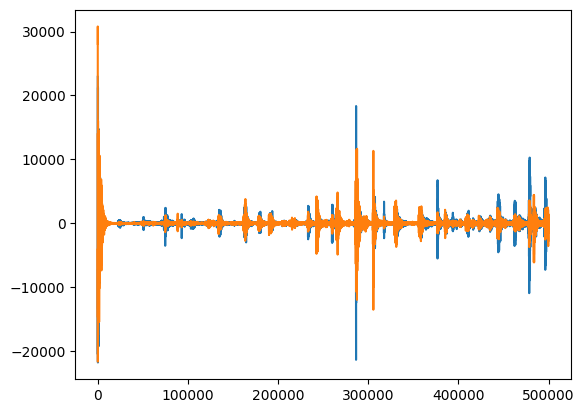

In [28]:
Y2 *= 600
Y2 = Y2.astype(np.int16)
print(type(Y2[0][0]))
plt.plot(Y2[0])
plt.plot(Y2[1])
plt.show()

sp.io.wavfile.write(filename='data/footstep1_ica.wav', rate=f1[0], data=Y2[0])
sp.io.wavfile.write(filename='data/footstep2_ica.wav', rate=f2[0], data=Y2[1])

In [24]:
Audio('data/footstep1_ica.wav')

In [25]:
Audio('data/footstep2_ica.wav')

In [31]:
Audio('data/footstep1_ica.wav')

In [32]:
Audio('data/footstep2_ica.wav')